In [1]:
import torch
import torch.nn as nn
import torch_geometric
import torch_geometric.nn as geo_nn
from torch_geometric.data import Data

In [2]:
from torchvision import datasets, transforms
from torch.nn.functional import binary_cross_entropy

from sklearn.metrics.pairwise import cosine_similarity as cos_sim
from skimage import color

import matplotlib.pyplot as plt
import numpy as np
import sys
import os
import math

from util.image import get_patches
from util.graph import get_adj
from util.CustomDatasets import ImageFolderWithPaths as IFWP
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
MAIN_PATH = '/groups/francescavitali/eb2/subImages1/H&E/'

# Full dataset
dataset = IFWP(MAIN_PATH, device=device)

In [5]:
WHITE_IMG = color.rgb2gray(np.zeros((224, 224, 3)) + 255)

In [9]:
img = np.array([dataset.__getitem__(0)[0]])
img = img.squeeze(0)

patches, num_w, num_h = get_patches(img)

Original shape: (6761, 11420, 3)
New shape: (6944, 11424, 3)
(1581, 224, 224, 3)


In [10]:
target_idxs = [0, 5, 32, 40, 56,
              285, 308, 313, 341,
              571, 624,
              854, 903, 900, 931,
              1103, 1281, 1310, 1368,
              1653, 1659, 1669, 1673, 1684, 1705, 1709]

In [11]:
patches.shape

(1581, 224, 224, 3)

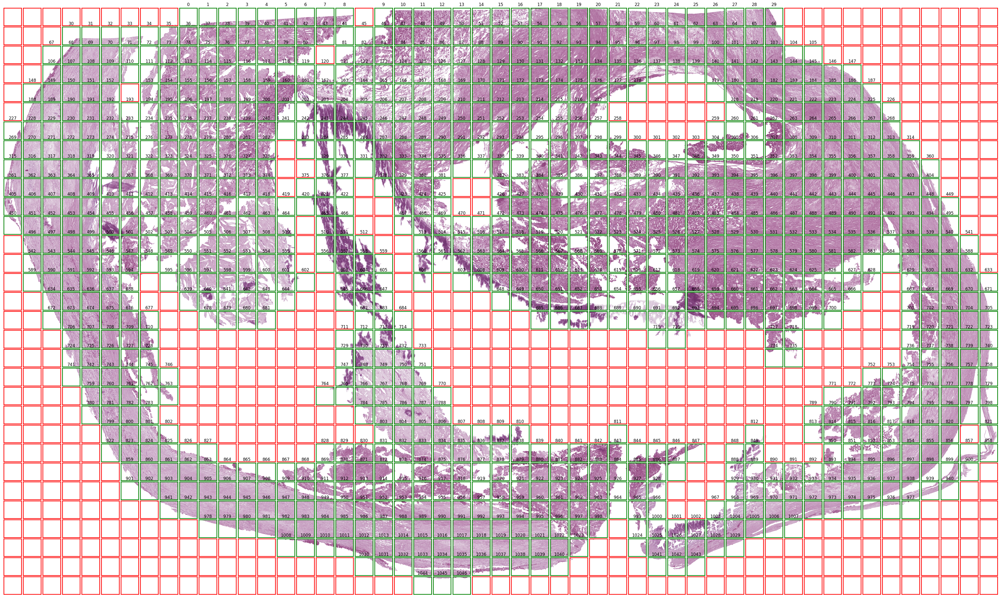

done


In [12]:
bad_idxs = 0
fig, axes = plt.subplots(num_h, num_w, figsize=(num_w, num_h), dpi=100)
for i in range(num_h):
    for j in range(num_w):
        idx = i * num_w + j
        
        ax = axes[i, j]
        ax.set_xticks([])
        ax.set_yticks([])
        
        gray_scale = color.rgb2gray(patches[idx])*255
        
        cos_sim_val = cos_sim([gray_scale.reshape(224*224)], [WHITE_IMG.reshape(224*224)]).item()
        
        if cos_sim_val > 1 - 1e-3:
            ax.spines[:].set_color('red')
            ax.spines[:].set_linewidth(2)
            bad_idxs += 1
        else:
            ax.spines[:].set_color('green')
            ax.spines[:].set_linewidth(2)
            ax.set_title(idx - bad_idxs)
            
#         ax.set_title(f'{cos_sim_val:5f}')
        
        ax.imshow(patches[idx])
        
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.savefig('tmp2.png')
plt.show()
print('done')

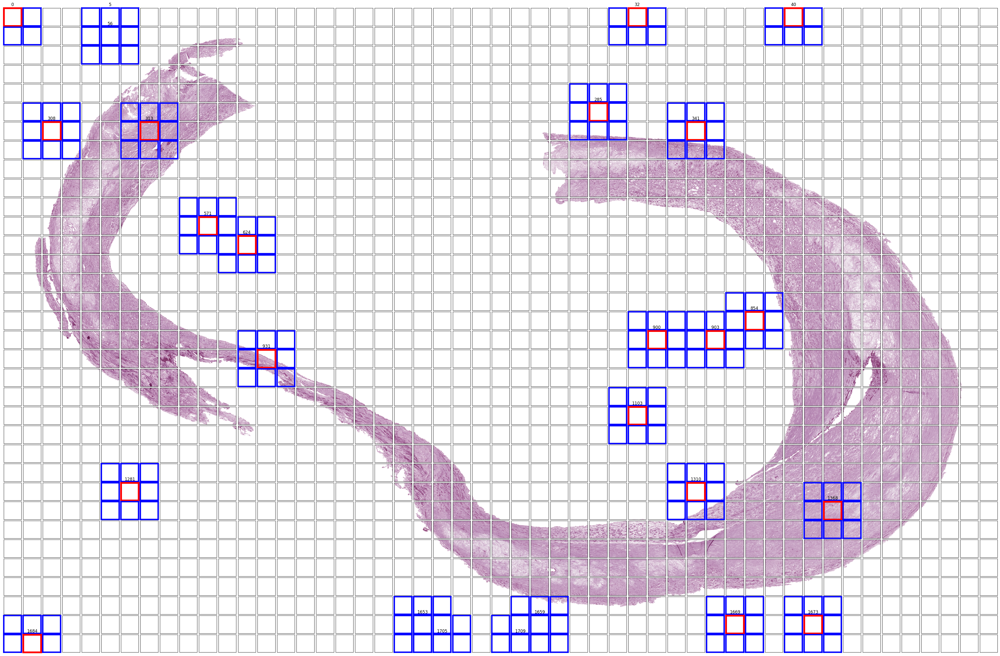

done


In [12]:
adj = [get_adj(x, num_w, num_h) for x in target_idxs]
fig, axes = plt.subplots(num_h, num_w, figsize=(num_w, num_h), dpi=100)
for i in range(num_h):
    for j in range(num_w):
        idx = i * num_w + j
        
        ax = axes[i, j]
        ax.set_xticks([])
        ax.set_yticks([])
            
        if idx in target_idxs:
            ax.spines[:].set_color('red')
            ax.spines[:].set_linewidth(5)
            ax.set_title(idx)
        for tmp_list in adj:
            if idx in tmp_list:
                ax.spines[:].set_color('blue')
                ax.spines[:].set_linewidth(4)
        
        ax.imshow(patches[idx])
        
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.savefig('tmp2.png')
plt.show()
print('done')